In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from wordcloud import WordCloud, STOPWORDS

In [2]:
dataset=pd.read_csv('../CSV Files/cleanedgoogleplaystore.csv')

In [3]:
dataset.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Last Updated Yr
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19.0,10000,Free,0.0,Everyone,Art & Design,"January 7, 2018",1.0,4.0,2018
1,Coloring book moana,ART_AND_DESIGN,3.9,199,14.0,500000,Free,0.0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0,4.0,2018
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,214,8.7,5000000,Free,0.0,Everyone,Art & Design,"August 1, 2018",1.0,4.0,2018
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,92,25.0,50000000,Free,0.0,Teen,Art & Design,"June 8, 2018",1.0,4.0,2018
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,199,2.8,100000,Free,0.0,Everyone,Art & Design;Creativity,"June 20, 2018",1.0,4.0,2018


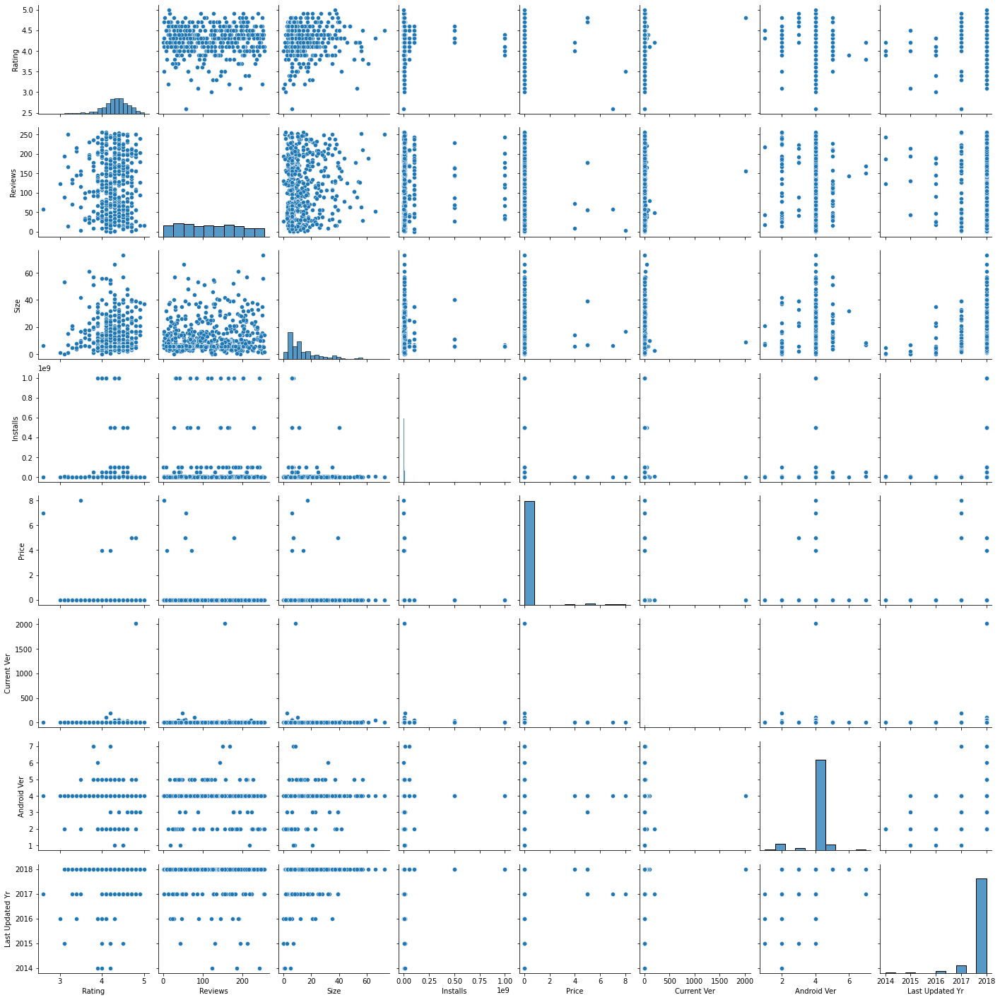

In [4]:
sns.pairplot(dataset[:500])

* No significant linear correlation found

## Category

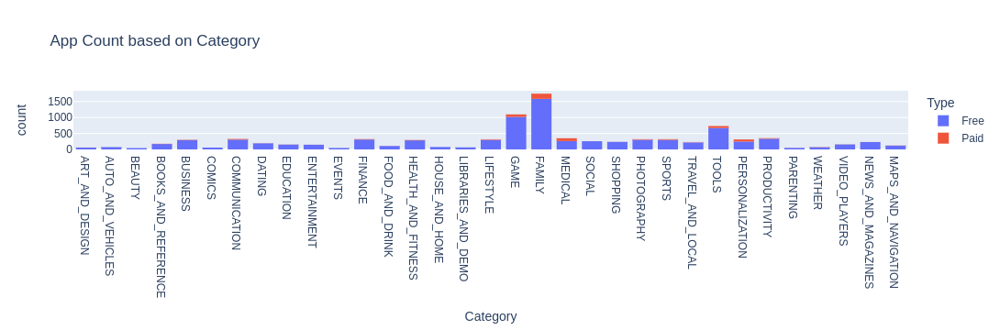

In [5]:
px.histogram(dataset,x='Category',color='Type',title='App Count based on Category')

In [6]:
sum(dataset['Category'].value_counts()<351)*100/len(dataset['Category'].unique())

87.87878787878788

* Most published App Category is "Family"(1746) followed by "Game"(1097) & "Tools"(733)
* Least published App Category is "Beauty"(42) followed by "Events"(45) & "Parenting"(50)
* Majority of all categories app count(87.87%) fall under the range [0-351] 
* Paid are much less compared to Free Apps
* Most paid apps are of type 'Family','Medical' & "Game"

## Rating vs Category

Text(0.5, 1.0, 'Boxplot of Rating VS Category')

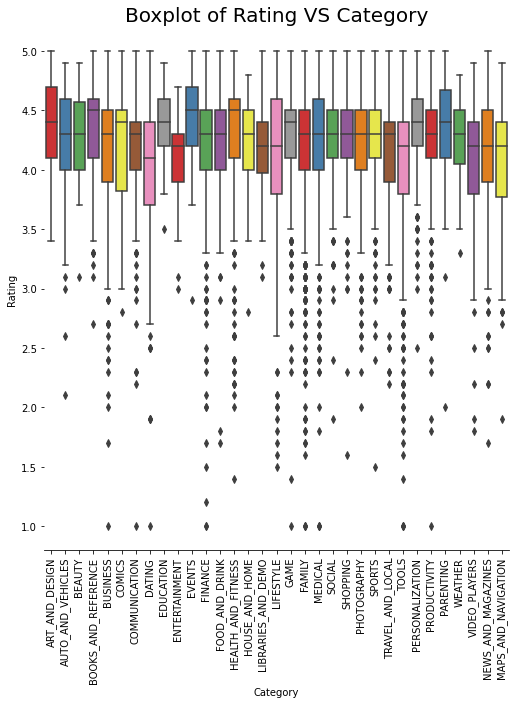

In [7]:
g = sns.catplot(x="Category",y="Rating",data=dataset, kind="box", height = 8 ,
palette = "Set1")
g.despine(left=True)
g.set_xticklabels(rotation=90)
g = g.set_ylabels("Rating")
plt.title('Boxplot of Rating VS Category',size = 20)

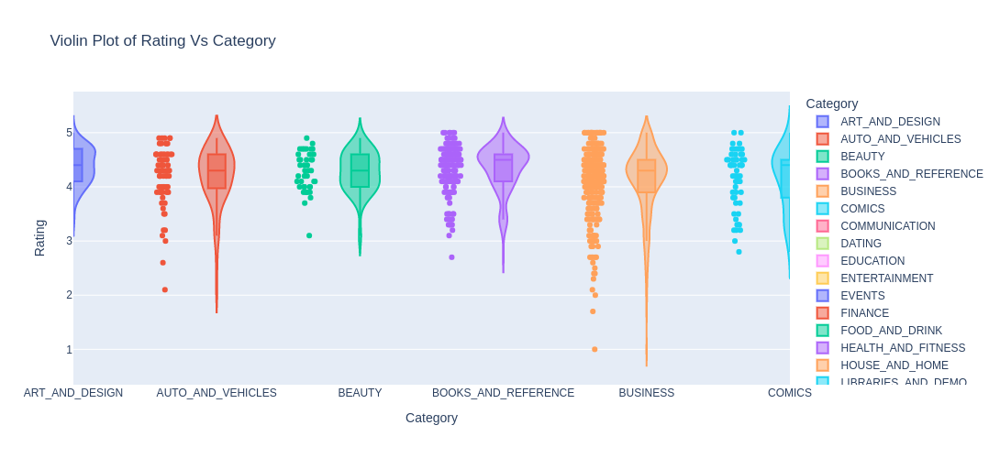

In [8]:
px.violin(data_frame=dataset,x='Category',y='Rating',color='Category',range_x=[0,5],height=500,box=True,points='all',title='Violin Plot of Rating Vs Category')

* Overall all of the categories have median Rating as around 4.3

## Size vs Category

Text(0.5, 1.0, 'Boxplot of Size vs Category')

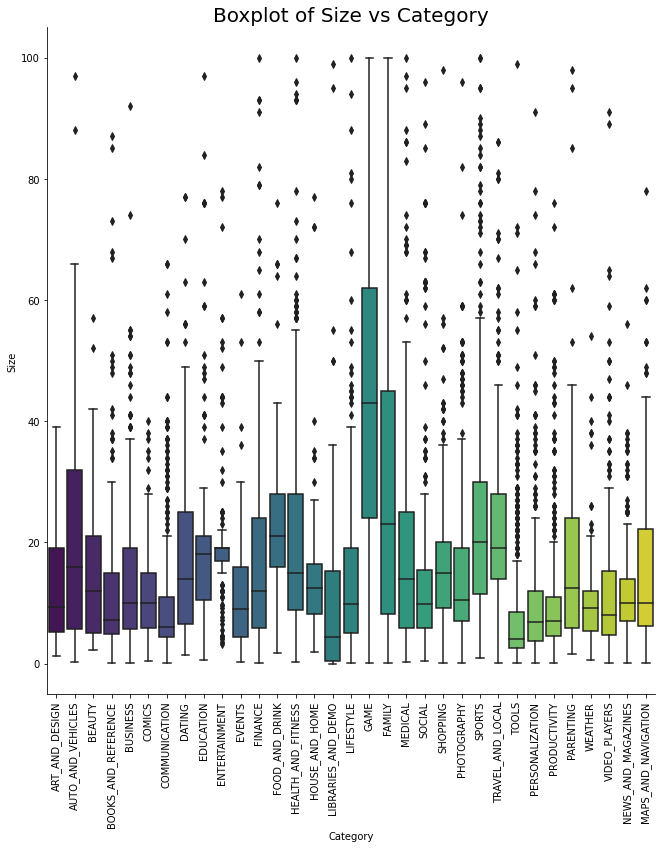

In [9]:
g = sns.catplot(x="Category",y="Size",data=dataset, kind="box", height =10,
palette = "viridis")
# g.despine(left=True)
g.set_xticklabels(rotation=90)
g = g.set_ylabels("Size")
plt.title('Boxplot of Size vs Category',size = 20)

* Games & Family tend to have large range of size than other categories. 
* There are outliers in almost all categories 


We can check whether bulky apps fare better with ratings

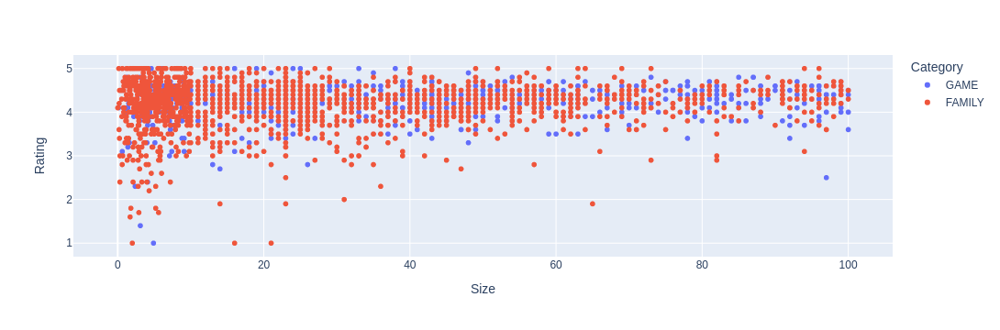

In [10]:
px.scatter(data_frame=dataset[(dataset['Category']=='GAME')| (dataset['Category']=='FAMILY')],x='Size',y='Rating',color='Category')

* Even bulky Family Apps & Games have higher rating compared to smaller ones. So we can safely assume that the large size is for a reason (maybe better graphics in case of games)

## Category vs Installs

<AxesSubplot:title={'center':'Bar Graph of Installs vs Category'}, xlabel='Category', ylabel='Installs (in 1000000)'>

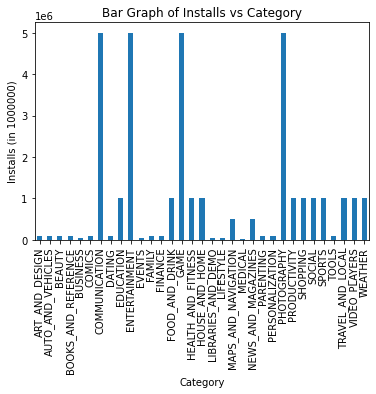

In [11]:
dataset.groupby('Category')['Installs'].median().plot.bar(title='Bar Graph of Installs vs Category',xlabel='Category',ylabel='Installs (in 1000000)')

* People tend to download more Communication, Entertainment, Photography apps & Games.

## Dive more into Paid Apps

In [12]:
paidAppsDf=dataset[dataset['Type']=='Paid']

In [13]:
paidAppsDf

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Last Updated Yr
222,TurboScan: scan documents and receipts in PDF,BUSINESS,4.7,178,6.80000,100000,Paid,4.99,Everyone,Business,"March 25, 2018",1.0,4.0,2018
223,Tiny Scanner Pro: PDF Doc Scan,BUSINESS,4.8,55,39.00000,100000,Paid,4.99,Everyone,Business,"April 11, 2017",3.0,3.0,2017
278,TurboScan: scan documents and receipts in PDF,BUSINESS,4.7,178,6.80000,100000,Paid,4.99,Everyone,Business,"March 25, 2018",1.0,4.0,2018
279,Tiny Scanner Pro: PDF Doc Scan,BUSINESS,4.8,55,39.00000,100000,Paid,4.99,Everyone,Business,"April 11, 2017",3.0,3.0,2017
414,Puffin Browser Pro,COMMUNICATION,4.0,71,6.10000,100000,Paid,3.99,Everyone,Communication,"July 5, 2018",7.0,4.0,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9258,FO Bixby,PERSONALIZATION,5.0,5,0.84082,100,Paid,0.99,Everyone,Personalization,"April 25, 2018",0.0,7.0,2018
9260,Mu.F.O.,GAME,5.0,2,16.00000,1,Paid,0.99,Everyone,Arcade,"March 3, 2017",1.0,2.0,2017
9305,Fast Tract Diet,HEALTH_AND_FITNESS,4.4,35,2.40000,1000,Paid,7.99,Everyone,Health & Fitness,"August 8, 2018",1.0,4.0,2018
9319,Trine 2: Complete Story,GAME,3.8,252,11.00000,10000,Paid,16.99,Teen,Action,"February 27, 2015",2.0,5.0,2015


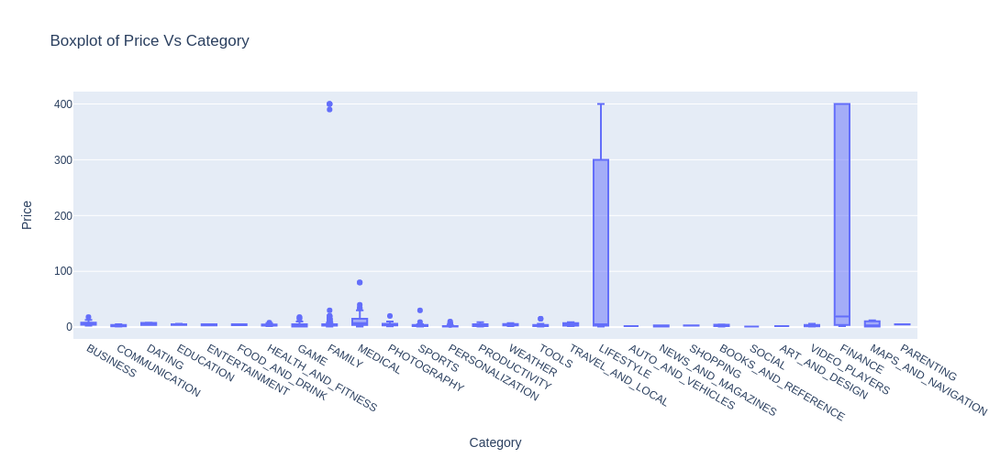

In [14]:
px.box(data_frame=paidAppsDf,x='Category',y='Price',title='Boxplot of Price Vs Category',height=500)

* There are some crazily expensive apps

### Junk Apps

In [15]:
paidAppsDf[paidAppsDf['Price']>90]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Last Updated Yr
4036,most expensive app (H),FAMILY,4.3,6,1.500000,100,Paid,399.99,Everyone,Entertainment,"July 16, 2018",1.0,7.0,2018
4189,💎 I'm rich,LIFESTYLE,3.8,206,26.000000,10000,Paid,399.99,Everyone,Lifestyle,"March 11, 2018",1.0,4.0,2018
4194,I'm Rich - Trump Edition,LIFESTYLE,3.6,19,7.300000,10000,Paid,400.00,Everyone,Lifestyle,"May 3, 2018",1.0,4.0,2018
5042,I am rich,LIFESTYLE,3.8,219,1.800000,100000,Paid,399.99,Everyone,Lifestyle,"January 12, 2018",2.0,4.0,2018
5045,I am Rich Plus,FAMILY,4.0,88,8.700000,10000,Paid,399.99,Everyone,Entertainment,"May 19, 2018",3.0,4.0,2018
5046,I am rich VIP,LIFESTYLE,3.8,155,2.600000,10000,Paid,299.99,Everyone,Lifestyle,"July 21, 2018",1.0,4.0,2018
5047,I Am Rich Premium,FINANCE,4.1,75,4.700000,50000,Paid,399.99,Everyone,Finance,"November 12, 2017",1.0,4.0,2017
5048,I am extremely Rich,LIFESTYLE,2.9,41,2.900000,1000,Paid,379.99,Everyone,Lifestyle,"July 1, 2018",1.0,4.0,2018
5049,I am Rich!,FINANCE,3.8,93,22.000000,1000,Paid,399.99,Everyone,Finance,"December 11, 2017",1.0,4.0,2017
5050,I am rich(premium),FINANCE,3.5,216,0.942383,5000,Paid,399.99,Everyone,Finance,"May 1, 2017",3.0,4.0,2017


* All of the Apps above $99 price are junk apps (just look at their names)

* To get correct price estimate we will eliminate the junk apps

### Prices of legit applications

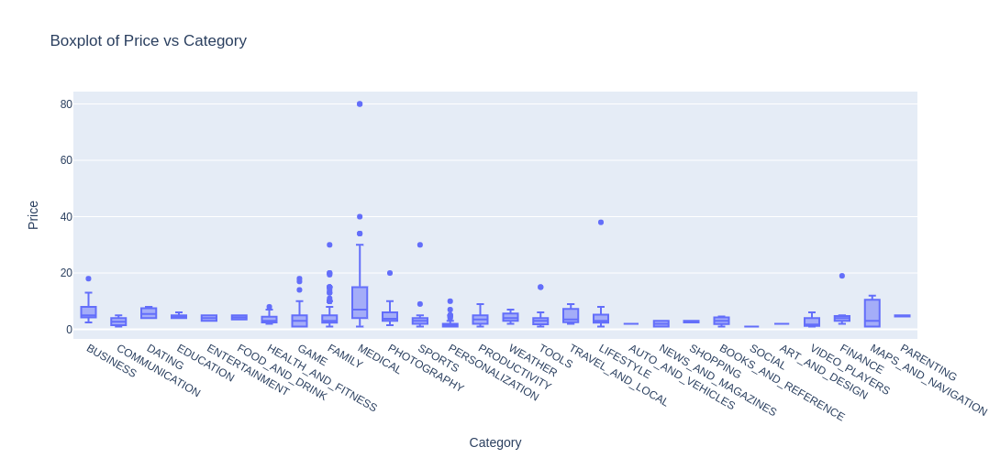

In [16]:
px.box(data_frame=paidAppsDf[paidAppsDf['Price']<99],x='Category',y='Price',title='Boxplot of Price vs Category',height=500)

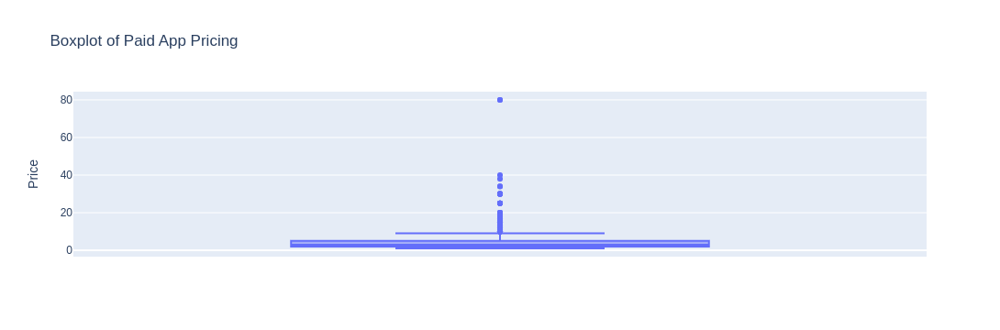

In [17]:
px.box(data_frame=paidAppsDf[paidAppsDf['Price']<99],y='Price',title='Boxplot of Paid App Pricing')

* Legit Medical Apps tend to be more expensive than any other category 
* Suitable price range for any legit paid app is ~ 1.99 to ~7.99 with ~3 dollars being a sweet spot

## Content Rating vs Rating

<AxesSubplot:title={'center':'Median Rating vs Content Rating'}, xlabel='Content Rating'>

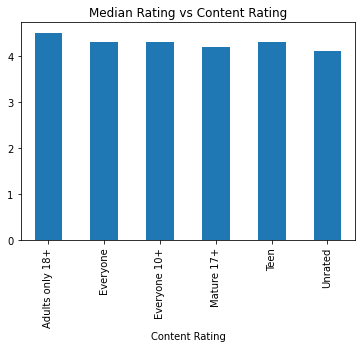

In [18]:
dataset.groupby('Content Rating')['Rating'].median().plot.bar(title='Median Rating vs Content Rating')

* All Genres are have median Rating around 4.2 

## Installation count vs Type

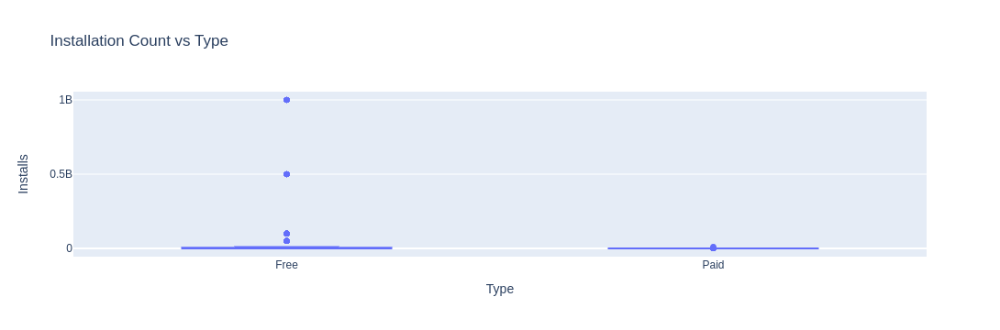

In [19]:
px.box(data_frame=dataset,x='Type',y='Installs',title='Installation Count vs Type')

* There are some crazily popular free apps

In [20]:
dataset[dataset['Installs']>500000000]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Last Updated Yr
144,Google Play Books,BOOKS_AND_REFERENCE,3.9,145,7.15,1000000000,Free,0.0,Teen,Books & Reference,"August 3, 2018",1.0,4.0,2018
322,Messenger – Text and Video Chat for Free,COMMUNICATION,4.0,31,6.10,1000000000,Free,0.0,Everyone,Communication,"August 1, 2018",3.0,4.0,2018
323,WhatsApp Messenger,COMMUNICATION,4.4,84,6.10,1000000000,Free,0.0,Everyone,Communication,"August 3, 2018",3.0,4.0,2018
325,Google Chrome: Fast & Secure,COMMUNICATION,4.3,243,6.10,1000000000,Free,0.0,Everyone,Communication,"August 1, 2018",3.0,4.0,2018
327,Gmail,COMMUNICATION,4.3,164,6.10,1000000000,Free,0.0,Everyone,Communication,"August 2, 2018",3.0,4.0,2018
328,Hangouts,COMMUNICATION,4.0,113,6.10,1000000000,Free,0.0,Everyone,Communication,"July 21, 2018",3.0,4.0,2018
368,WhatsApp Messenger,COMMUNICATION,4.4,84,6.10,1000000000,Free,0.0,Everyone,Communication,"August 3, 2018",3.0,4.0,2018
369,Messenger – Text and Video Chat for Free,COMMUNICATION,4.0,178,6.10,1000000000,Free,0.0,Everyone,Communication,"August 1, 2018",3.0,4.0,2018
373,Hangouts,COMMUNICATION,4.0,41,6.10,1000000000,Free,0.0,Everyone,Communication,"July 21, 2018",3.0,4.0,2018
378,Skype - free IM & video calls,COMMUNICATION,4.1,201,6.10,1000000000,Free,0.0,Everyone,Communication,"August 3, 2018",3.0,4.0,2018


* All of the highly top tier downloaded apps are Free Apps by Large companies like Google, Facebook & games like Subway Surfers

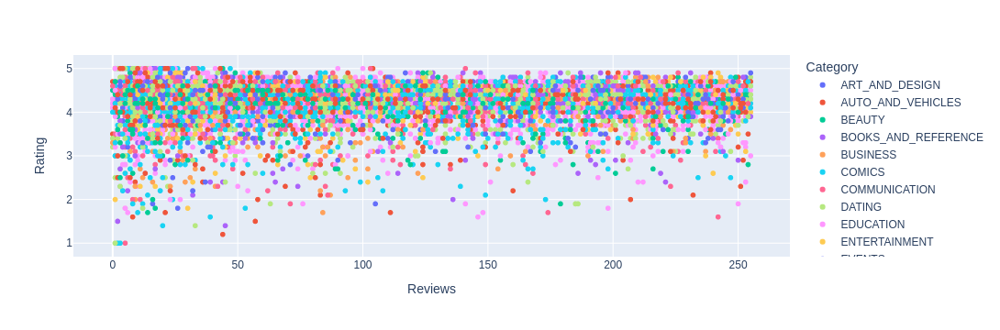

In [21]:
px.scatter(data_frame=dataset,x='Reviews',y='Rating',color='Category')

* No relation/hypothesis found

---------------

## Now we will focus on the Reviews dataset

In [22]:
dataset_reviews=pd.read_csv('../CSV Files/googleplaystore_reviews_merged.csv')

In [23]:
dataset_reviews.head()

,App,Category,Type,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,Coloring book moana,ART_AND_DESIGN,Free,A kid's excessive ads. The types ads allowed a...,Negative,-0.250,1.000000
1,Coloring book moana,ART_AND_DESIGN,Free,It bad >:(,Negative,-0.725,0.833333
2,Coloring book moana,ART_AND_DESIGN,Free,like,Neutral,0.000,0.000000
3,Coloring book moana,ART_AND_DESIGN,Free,I love colors inspyering,Positive,0.500,0.600000
4,Coloring book moana,ART_AND_DESIGN,Free,I hate,Negative,-0.800,0.900000


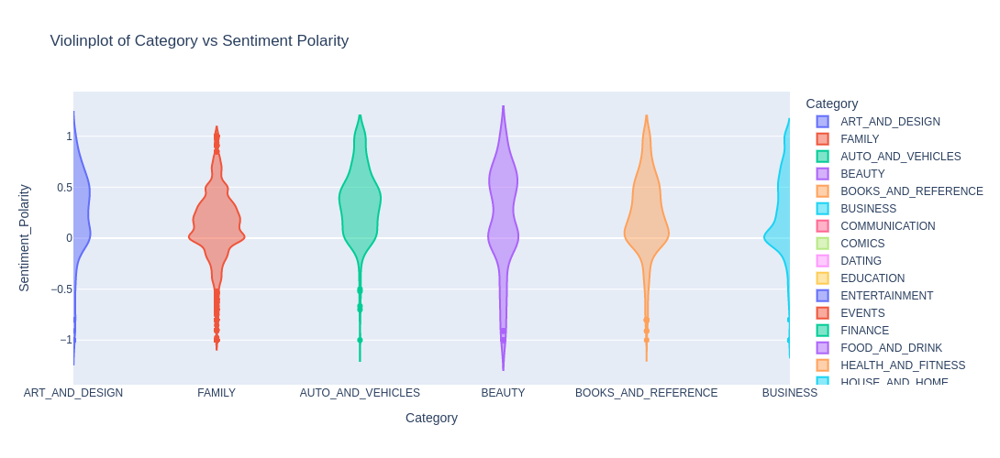

In [24]:
px.violin(data_frame=dataset_reviews,x='Category',y='Sentiment_Polarity',color='Category',range_x=[0,5],height=500,title='Violinplot of Category vs Sentiment Polarity')

* Comics have much better positive reviews compared to other categories
* All of the categories reviews are skewed to the bottom (negative reviews). So there are more positive and neutral reviews than Negative

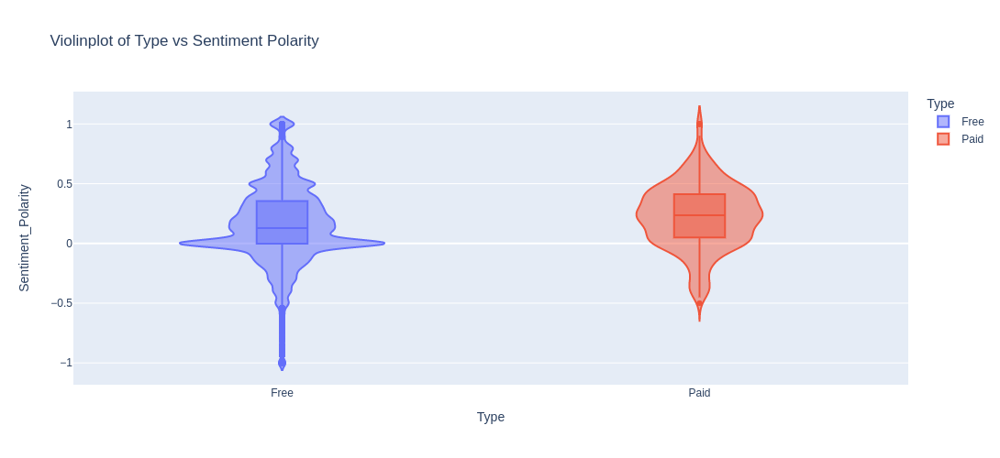

In [25]:
px.violin(data_frame=dataset_reviews,x='Type',y='Sentiment_Polarity',color='Type',height=500,box=True,title='Violinplot of Type vs Sentiment Polarity')

* There are more neutral reviews for Free Apps. There are some harsh reviews in Free Apps well.
* Paid apps have more partially positive reviews (polarity ~0.5)
* Paid apps do not have harsh reviews. (most negatively reviewed paid app has -0.5 polarity)

## Create a WordCloud to represent major concern/complement in Apps

### Paid App WordCloud

In [26]:
paid_reviews_dataset=dataset_reviews[dataset_reviews['Type']=='Paid']
paid_reviews_text=paid_reviews_dataset['Translated_Review'].values

In [27]:
wordcloud_paid=WordCloud(stopwords=STOPWORDS.union({'widget','time','weather','game','app'})).generate(str(paid_reviews_text).lower())

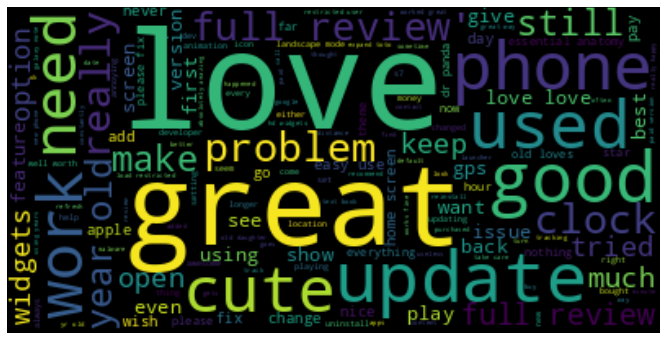

In [28]:
plt.figure(figsize=(20, 6))
plt.imshow(wordcloud_paid,interpolation="bilinear")
plt.axis("off")
plt.show()

* Positive Words : Love, Great, Good
* Negative Words: problem
* Words of concern : update

In [29]:
update_reviews_paid=paid_reviews_dataset[paid_reviews_dataset['Translated_Review'].str.contains('update','Update')]

In [30]:
print("The number of positive reviews containing the word update is ",len(update_reviews_paid[update_reviews_paid.Sentiment_Polarity>0]))
print("The number of negative reviews containing the word update is ",len(update_reviews_paid[update_reviews_paid.Sentiment_Polarity<=0]))

The number of positive reviews containing the word update is  63
The number of negative reviews containing the word update is  15


* Thus 'update' word is majorly related to positive reviews. But we cannot ignore the negative reviews either.

###### Free App WordCloud

In [31]:
free_reviews_dataset=dataset_reviews[dataset_reviews['Type']=='Free']
free_reviews_text=free_reviews_dataset['Translated_Review'].values

In [32]:
wordcloud_free=WordCloud(stopwords=STOPWORDS.union({'app','gallery','let'})).generate(str(free_reviews_text))

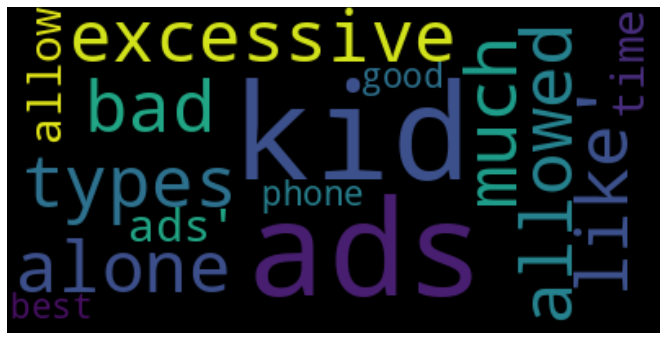

In [33]:
plt.figure(figsize=(20, 6))
plt.imshow(wordcloud_free,interpolation="bilinear")
plt.axis("off")
plt.show()

* Positive Words : Good, Best
* Negative Words: ads, bad
* Words of concern : kid, excessive,alone

In [34]:
kid_reviews_free=free_reviews_dataset[free_reviews_dataset['Translated_Review'].str.contains('kid','Kid')]

In [35]:
print("The number of positive reviews containing the word kid is ",len(kid_reviews_free[kid_reviews_free.Sentiment_Polarity>0]))
print("The number of negative reviews containing the word kid is ",len(kid_reviews_free[kid_reviews_free.Sentiment_Polarity<=0]))

The number of positive reviews containing the word kid is  435
The number of negative reviews containing the word kid is  169


* Reviews containing the word 'kid' are majorly positive but we simply cannot ignore the high negative count as well

In [36]:
excessive_reviews_free=free_reviews_dataset[free_reviews_dataset['Translated_Review'].str.contains('excessive','Excessive')]

In [37]:
print("The number of positive reviews containing the word excessive is ",len(excessive_reviews_free[excessive_reviews_free.Sentiment_Polarity>0]))
print("The number of negative reviews containing the word excessive is ",len(excessive_reviews_free[excessive_reviews_free.Sentiment_Polarity<=0]))

The number of positive reviews containing the word excessive is  33
The number of negative reviews containing the word excessive is  10


* Reviews containing the word 'excessive' are majorly positive but we simply cannot ignore the high negative count as well

In [38]:
alone_reviews_free=free_reviews_dataset[free_reviews_dataset['Translated_Review'].str.contains('alone')]

In [39]:
print("The number of positive reviews containing the word alone is ",len(alone_reviews_free[alone_reviews_free.Sentiment_Polarity>0]))
print("The number of negative reviews containing the word alone is ",len(alone_reviews_free[alone_reviews_free.Sentiment_Polarity<=0]))

The number of positive reviews containing the word alone is  72
The number of negative reviews containing the word alone is  94


* Negative & Positive reviews contain almost equal amount of the world 'alone' (even though there are more negative reviews by a small margin )

-----

Summary of PlayStore Analysis:
 Summary of PlayStore Analysis:
 *  Most published app Category is "Family" followed by "Game" & "Tools".
 *  There are more free apps compared to paid.
 *  Most paid apps belong to "Family", "Medical" & "Game".
 *  Family Apps & games can have bulky size.
 *  People tend to download more Communication, Entertainment, Photography apps & Games.
 *  All apps costing above $99 are junk.
 *  Suitable app cost range is ~ 1.99 to ~7.99 with ~3 being a sweet spot. Medical apps may cost more than this range.
 *  All of the crazily downloaded apps are free apps by Google,Facebook, Skype & free games like Subway Surfers.
 *  Comics apps have better reviews than any other category.
 *  There exists more positive or neutral reviews in every category. 
 *  Free Apps have some harsh reviews compared to paid apps.
 *  Issues regarding update should be a major concern for paid apps.
 *  Issues regarding ads should be a major concern for free apps.

----------
### The End
----------